<h1 align = 'center'>Intrusion Detection In Wireless Sensor Networks</h1>
<hr>


<img src="https://psiborg.in/wp-content/uploads/2021/07/Embedded-banner-2048_11zon-1.jpg" alt="wsn-google-image" width="1000" height="1000">
<br>
<code>img credit: psiborg</code>


In [458]:
#primary utils
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from pandas_profiling import profile_report
from pandas.plotting import scatter_matrix

#sklearn
import sklearn
from sklearn.preprocessing import FunctionTransformer
from sklearn.compose import ColumnTransformer
from sklearn.model_selection import train_test_split,GridSearchCV,RepeatedStratifiedKFold
#models
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression

#imblean tools for handling imablaced dataset
from imblearn.pipeline import Pipeline
from imblearn.over_sampling import SMOTE,BorderlineSMOTE
from imblearn.under_sampling import RandomUnderSampler

#count frequencies
from collections import Counter

In [304]:
df = pd.read_csv("./WSN-DS.csv")
df.head()

,id,Time,Is_CH,who CH,Dist_To_CH,ADV_S,ADV_R,JOIN_S,JOIN_R,SCH_S,SCH_R,Rank,DATA_S,DATA_R,Data_Sent_To_BS,dist_CH_To_BS,send_code,Expaned Energy,Attack type
0,101000,50,1,101000,0.00000,1,0,0,25,1,0,0,0,1200,48,130.08535,0,2.46940,Normal
1,101001,50,0,101044,75.32345,0,4,1,0,0,1,2,38,0,0,0.00000,4,0.06957,Normal
2,101002,50,0,101010,46.95453,0,4,1,0,0,1,19,41,0,0,0.00000,3,0.06898,Normal
3,101003,50,0,101044,64.85231,0,4,1,0,0,1,16,38,0,0,0.00000,4,0.06673,Normal
4,101004,50,0,101010,4.83341,0,4,1,0,0,1,25,41,0,0,0.00000,3,0.06534,Normal


In [305]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 374661 entries, 0 to 374660
Data columns (total 19 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0    id               374661 non-null  int64  
 1    Time             374661 non-null  int64  
 2    Is_CH            374661 non-null  int64  
 3    who CH           374661 non-null  int64  
 4    Dist_To_CH       374661 non-null  float64
 5    ADV_S            374661 non-null  int64  
 6    ADV_R            374661 non-null  int64  
 7    JOIN_S           374661 non-null  int64  
 8    JOIN_R           374661 non-null  int64  
 9    SCH_S            374661 non-null  int64  
 10   SCH_R            374661 non-null  int64  
 11  Rank              374661 non-null  int64  
 12   DATA_S           374661 non-null  int64  
 13   DATA_R           374661 non-null  int64  
 14   Data_Sent_To_BS  374661 non-null  int64  
 15   dist_CH_To_BS    374661 non-null  float64
 16   send_code        37

In [306]:
df.describe(include = int)

,id,Time,Is_CH,who CH,ADV_S,ADV_R,JOIN_S,JOIN_R,SCH_S,SCH_R,Rank,DATA_S,DATA_R,Data_Sent_To_BS,send_code
count,3.746610e+05,374661.000000,374661.000000,3.746610e+05,374661.000000,374661.000000,374661.000000,374661.000000,374661.000000,374661.000000,374661.000000,374661.000000,374661.000000,374661.000000,374661.000000
mean,2.749693e+05,1064.748712,0.115766,2.749804e+05,0.267698,6.940562,0.779905,0.737493,0.288984,0.747452,9.687104,44.857925,73.890045,4.569448,2.497957
std,3.898986e+05,899.646164,0.319945,3.899112e+05,2.061148,7.044319,0.414311,4.691498,2.754746,0.434475,14.681901,42.574464,230.246335,19.679155,2.407337
min,1.010000e+05,50.000000,0.000000,1.010000e+05,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1.070930e+05,353.000000,0.000000,1.070960e+05,0.000000,3.000000,1.000000,0.000000,0.000000,0.000000,1.000000,13.000000,0.000000,0.000000,1.000000
50%,1.160710e+05,803.000000,0.000000,1.160720e+05,0.000000,5.000000,1.000000,0.000000,0.000000,1.000000,3.000000,35.000000,0.000000,0.000000,2.000000
75%,2.150720e+05,1503.000000,0.000000,2.150730e+05,0.000000,7.000000,1.000000,0.000000,0.000000,1.000000,13.000000,62.000000,0.000000,0.000000,4.000000
max,3.402096e+06,3600.000000,1.000000,3.402100e+06,97.000000,117.000000,1.000000,124.000000,99.000000,1.000000,99.000000,241.000000,1496.000000,241.000000,15.000000


In [307]:
df.columns

Index([' id', ' Time', ' Is_CH', ' who CH', ' Dist_To_CH', ' ADV_S', ' ADV_R',
       ' JOIN_S', ' JOIN_R', ' SCH_S', ' SCH_R', 'Rank', ' DATA_S', ' DATA_R',
       ' Data_Sent_To_BS', ' dist_CH_To_BS', ' send_code ', 'Expaned Energy',
       'Attack type'],
      dtype='object')

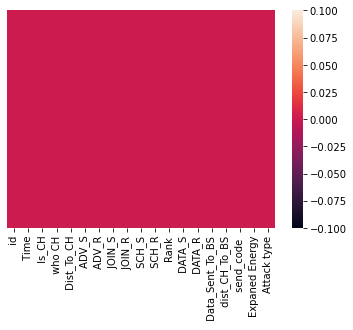

In [308]:
sns.heatmap(df.isna(),yticklabels = False);

In [309]:
lower = lambda x: [i.lower().lstrip() for i in x] #make columns lower case and strip off left whitespacespaces

# df.columns = [x.lower().lstrip() for x in df.columns] 
df.columns = lower(df.columns)

df.columns = [x.replace(' ',"_") for x in df.columns] #replace all spaces in column names with underscore

In [310]:
df.columns

Index(['id', 'time', 'is_ch', 'who_ch', 'dist_to_ch', 'adv_s', 'adv_r',
       'join_s', 'join_r', 'sch_s', 'sch_r', 'rank', 'data_s', 'data_r',
       'data_sent_to_bs', 'dist_ch_to_bs', 'send_code_', 'expaned_energy',
       'attack_type'],
      dtype='object')

In [311]:
df.head()

,id,time,is_ch,who_ch,dist_to_ch,adv_s,adv_r,join_s,join_r,sch_s,sch_r,rank,data_s,data_r,data_sent_to_bs,dist_ch_to_bs,send_code_,expaned_energy,attack_type
0,101000,50,1,101000,0.00000,1,0,0,25,1,0,0,0,1200,48,130.08535,0,2.46940,Normal
1,101001,50,0,101044,75.32345,0,4,1,0,0,1,2,38,0,0,0.00000,4,0.06957,Normal
2,101002,50,0,101010,46.95453,0,4,1,0,0,1,19,41,0,0,0.00000,3,0.06898,Normal
3,101003,50,0,101044,64.85231,0,4,1,0,0,1,16,38,0,0,0.00000,4,0.06673,Normal
4,101004,50,0,101010,4.83341,0,4,1,0,0,1,25,41,0,0,0.00000,3,0.06534,Normal


In [312]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 374661 entries, 0 to 374660
Data columns (total 19 columns):
 #   Column           Non-Null Count   Dtype  
---  ------           --------------   -----  
 0   id               374661 non-null  int64  
 1   time             374661 non-null  int64  
 2   is_ch            374661 non-null  int64  
 3   who_ch           374661 non-null  int64  
 4   dist_to_ch       374661 non-null  float64
 5   adv_s            374661 non-null  int64  
 6   adv_r            374661 non-null  int64  
 7   join_s           374661 non-null  int64  
 8   join_r           374661 non-null  int64  
 9   sch_s            374661 non-null  int64  
 10  sch_r            374661 non-null  int64  
 11  rank             374661 non-null  int64  
 12  data_s           374661 non-null  int64  
 13  data_r           374661 non-null  int64  
 14  data_sent_to_bs  374661 non-null  int64  
 15  dist_ch_to_bs    374661 non-null  float64
 16  send_code_       374661 non-null  int6

In [313]:
plt.style.available

['Solarize_Light2',
 '_classic_test_patch',
 '_mpl-gallery',
 '_mpl-gallery-nogrid',
 'bmh',
 'classic',
 'dark_background',
 'fast',
 'fivethirtyeight',
 'ggplot',
 'grayscale',
 'seaborn',
 'seaborn-bright',
 'seaborn-colorblind',
 'seaborn-dark',
 'seaborn-dark-palette',
 'seaborn-darkgrid',
 'seaborn-deep',
 'seaborn-muted',
 'seaborn-notebook',
 'seaborn-paper',
 'seaborn-pastel',
 'seaborn-poster',
 'seaborn-talk',
 'seaborn-ticks',
 'seaborn-white',
 'seaborn-whitegrid',
 'tableau-colorblind10']

In [314]:
df.shape

(374661, 19)

In [316]:
not_duplicated = len(df) - len(df[df.duplicated()])
duplicated = len(df) - not_duplicated

print("total number of duplicated rows: ",duplicated)

print("percentage duplicated: ",round((len(df[df.duplicated()])/len(df))*100,3))

total number of duplicated rows:  8873
percentage duplicated:  2.368


In [37]:
df.profile_report()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

<AxesSubplot:>

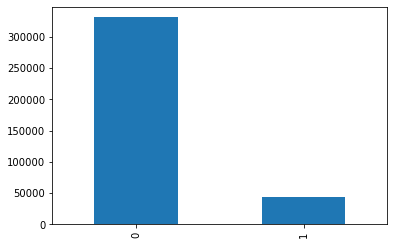

In [22]:
#is_ch; A flag to distinguish whether the node is CH with value 1 or normal node with value 0.
#how many channels are present


df['is_ch'].value_counts().plot(kind = 'bar')

In [83]:
df.attack_type.unique()


[0.1, 0.1, 0.1, 0.1, 0.1]

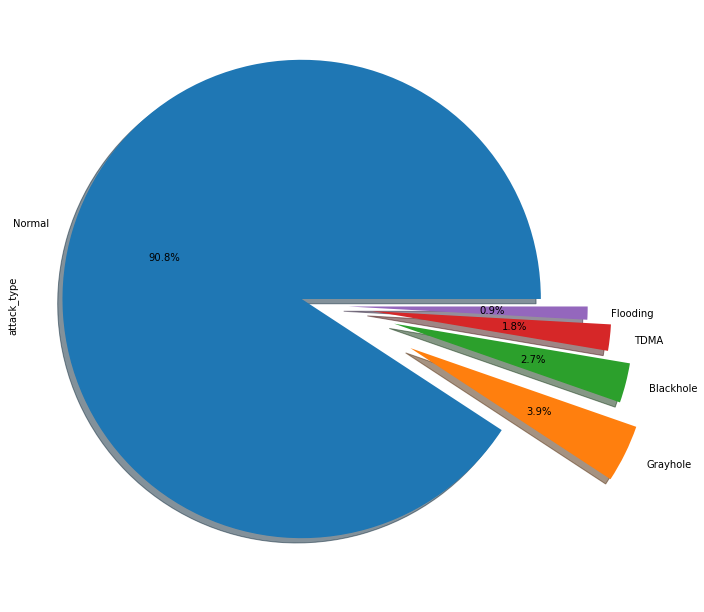

In [91]:
#category distribution
plt.figure(figsize = (11,11))
df['attack_type'].value_counts().plot(kind = 'pie',explode = [0.1,0.4,0.3,0.2,0.1],shadow = True,autopct = '%1.1f%%');

array([[<AxesSubplot:xlabel='id', ylabel='id'>,
        <AxesSubplot:xlabel='time', ylabel='id'>,
        <AxesSubplot:xlabel='is_ch', ylabel='id'>,
        <AxesSubplot:xlabel='who_ch', ylabel='id'>,
        <AxesSubplot:xlabel='dist_to_ch', ylabel='id'>,
        <AxesSubplot:xlabel='adv_s', ylabel='id'>,
        <AxesSubplot:xlabel='adv_r', ylabel='id'>,
        <AxesSubplot:xlabel='join_s', ylabel='id'>,
        <AxesSubplot:xlabel='join_r', ylabel='id'>,
        <AxesSubplot:xlabel='sch_s', ylabel='id'>,
        <AxesSubplot:xlabel='sch_r', ylabel='id'>,
        <AxesSubplot:xlabel='rank', ylabel='id'>,
        <AxesSubplot:xlabel='data_s', ylabel='id'>,
        <AxesSubplot:xlabel='data_r', ylabel='id'>,
        <AxesSubplot:xlabel='data_sent_to_bs', ylabel='id'>,
        <AxesSubplot:xlabel='dist_ch_to_bs', ylabel='id'>,
        <AxesSubplot:xlabel='send_code_', ylabel='id'>,
        <AxesSubplot:xlabel='expaned_energy', ylabel='id'>],
       [<AxesSubplot:xlabel='id', ylabel='ti

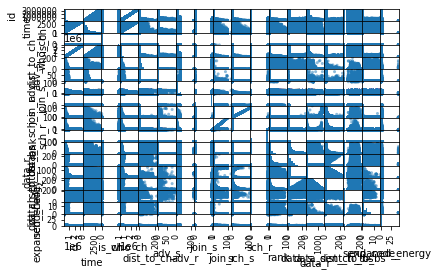

In [193]:
scatter_matrix(df.select_dtypes(float))

# Assessment Report 
<ul>
    <li>No missing data was found</li>
    <li>2.368% of the data has been found to be duplicated, thats a total of 8873</li>
    <li>Target or predictand is heavily imbalanced, with 'Normal' being the model class covering over 90% samples</li>
</ul>

<AxesSubplot:>

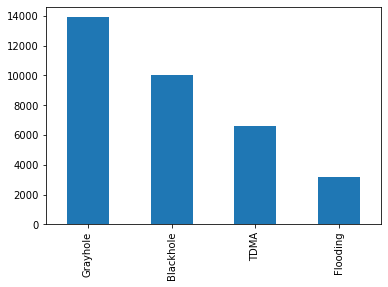

In [100]:
df = df.query("attack_type != 'Normal'").drop_duplicates()

# Data Splitting and Preprocessing

<hr>

In [447]:
drop_duplicates =  lambda x:x.drop_duplicates()
df = drop_duplicates(df)

In [327]:
#drop_duplicates =  lambda x:x.drop_duplicates() #also possible but note that lambda functions are not pickleable

def drop_duplicates(X,y):
    """drop duplicates in x
    
    Args:
        X:pandas.DataFrame
    Return:
        pandas.DataFrame | pandas dataframe containing no duplicated values
        """
    data = pd.concat([X,y],axis = 1)
    return data.drop_duplicates()

In [328]:
transformer = FunctionTransformer(drop_duplicates,kw_args = {X:})
transformer

FunctionTransformer(func=<function drop_duplicates at 0x000002753739CB80>)

In [450]:
#available params for tuning
transformer.get_params()

{'accept_sparse': False,
 'check_inverse': True,
 'feature_names_out': None,
 'func': <function __main__.drop_duplicates(X, y)>,
 'inv_kw_args': None,
 'inverse_func': None,
 'kw_args': None,
 'validate': False}

In [448]:
X = df.iloc[:,df.columns!='attack_type']
y = df['attack_type']

In [449]:
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.30, random_state=42,stratify = y) #applying data splitting with stratified sampling on the target variable due to class imbalance

In [431]:
over = SMOTE(sampling_strategy='not majority', k_neighbors=5)
undersample = RandomUnderSampler(sampling_strategy= {'Normal':10217})

borderline_oversample  = BorderlineSMOTE() #variant of smote | oversampling technique

#--Under Sampling
undersample_all = RandomUnderSampler(sampling_strategy = 'all')

## K Nearest Neigbors Algorithm

In [451]:
knn_model = KNeighborsClassifier(n_neighbors = 5) #knn model

#construct pipeline steps

knn_steps = [('sampling', undersample_all),  ('model',knn_model)]

In [452]:
knn_pipeline = Pipeline(steps= knn_steps)
knn_pipeline

Pipeline(steps=[('sampling', RandomUnderSampler(sampling_strategy='all')),
                ('model', KNeighborsClassifier())])

In [453]:
#Hyper Parameters
knn_pipeline.get_params()

{'memory': None,
 'steps': [('sampling', RandomUnderSampler(sampling_strategy='all')),
  ('model', KNeighborsClassifier())],
 'verbose': False,
 'sampling': RandomUnderSampler(sampling_strategy='all'),
 'model': KNeighborsClassifier(),
 'sampling__random_state': None,
 'sampling__replacement': False,
 'sampling__sampling_strategy': 'all',
 'model__algorithm': 'auto',
 'model__leaf_size': 30,
 'model__metric': 'minkowski',
 'model__metric_params': None,
 'model__n_jobs': None,
 'model__n_neighbors': 5,
 'model__p': 2,
 'model__weights': 'uniform'}

In [454]:
knn_pipeline.fit(X_train,y_train)

Pipeline(steps=[('sampling', RandomUnderSampler(sampling_strategy='all')),
                ('model', KNeighborsClassifier())])

In [455]:
knn_pipeline.score(X_test,y_test)

0.7771945651876759

In [466]:
?GridSearchCV

### Model Tuning 

In [ ]:
param_grid = {
    'model__n_neigbors':list(range(1,12,2)),
    'model__metric':['euclidean','cosine','manhattan','l1','l2']
}

GridSearchCV()